In [ ]:
# =============================
# 2D Point Robot - RRT* (Complete Version with Rewire)
# =============================

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import ipywidgets as widgets
from IPython.display import display
import random

# =============================
# Environment
# =============================
obstacles = [
    (2, 2, 2, 4),
    (6, 0, 2, 5),
    (3, 7, 4, 2)
]

X_LIMIT = 10
Y_LIMIT = 10

# =============================
# Collision Check
# =============================
def collision(point):
    x, y = point
    for (ox, oy, w, h) in obstacles:
        if ox <= x <= ox + w and oy <= y <= oy + h:
            return True
    return False

def line_collision(p1, p2):
    # 線分上の20点をサンプリングして障害物との衝突を判定
    for t in np.linspace(0, 1, 20):
        p = p1 + t * (p2 - p1)
        if collision(p):
            return True
    return False

# =============================
# RRT* Logic
# =============================
class Node:
    def __init__(self, point):
        self.point = point
        self.parent = None
        self.cost = 0.0

def distance(a, b):
    return np.linalg.norm(a - b)

def rrt_star(start, goal, max_iter=800, step_size=0.5, radius=1.5):
    nodes = []
    start_node = Node(start)
    nodes.append(start_node)

    for _ in range(max_iter):
        # 1. サンプリング (10%の確率でゴールを狙う Goal Bias)
        if random.random() < 0.1:
            rand = goal
        else:
            rand = np.array([random.uniform(0, X_LIMIT),
                             random.uniform(0, Y_LIMIT)])

        # 2. Nearest: 最も近い既存ノードを探す
        nearest_node = min(nodes, key=lambda n: distance(n.point, rand))

        # 3. Steer: 一定距離 step_size だけ伸ばす
        direction = rand - nearest_node.point
        dist = np.linalg.norm(direction)
        if dist == 0: continue

        new_point = nearest_node.point + (direction / dist) * min(step_size, dist)

        # 4. 衝突判定
        if collision(new_point) or line_collision(nearest_node.point, new_point):
            continue

        new_node = Node(new_point)

        # --- RRT* 特有の処理 1: Choose Parent ---
        # 半径 radius 内のノードから、最も累積コストが低くなる親候補を探す
        neighbors = [n for n in nodes if distance(n.point, new_point) < radius]

        best_parent = nearest_node
        min_cost = nearest_node.cost + distance(nearest_node.point, new_point)

        for neighbor in neighbors:
            cost_via_neighbor = neighbor.cost + distance(neighbor.point, new_point)
            if cost_via_neighbor < min_cost:
                if not line_collision(neighbor.point, new_point):
                    best_parent = neighbor
                    min_cost = cost_via_neighbor

        new_node.parent = best_parent
        new_node.cost = min_cost
        nodes.append(new_node)

        # --- RRT* 特有の処理 2: Rewire ---
        # 新しいノードを経由したほうが、既存の隣人たちのコストが下がるなら繋ぎ変える
        for neighbor in neighbors:
            cost_via_new = new_node.cost + distance(new_node.point, neighbor.point)
            if cost_via_new < neighbor.cost:
                if not line_collision(new_node.point, neighbor.point):
                    neighbor.parent = new_node
                    neighbor.cost = cost_via_new

    # ゴールに最も近いノードを探してパスを作成
    goal_node = min(nodes, key=lambda n: distance(n.point, goal))
    path = []
    if distance(goal_node.point, goal) < step_size:
        curr = goal_node
        while curr is not None:
            path.append(curr.point)
            curr = curr.parent
        path.reverse()
        # 最後にゴール地点を追加
        if not np.array_equal(path[-1], goal):
            path.append(goal)

    return nodes, path

# =============================
# Visualization
# =============================
def run_planner(sx, sy, gx, gy, iterations):
    start = np.array([sx, sy])
    goal = np.array([gx, gy])

    if collision(start) or collision(goal):
        print("Start or Goal inside obstacle")
        return

    nodes, path = rrt_star(start, goal, max_iter=iterations)

    fig, ax = plt.subplots(figsize=(7,7))

    # 障害物の描画
    for (ox, oy, w, h) in obstacles:
        ax.add_patch(Rectangle((ox, oy), w, h, color='gray', alpha=0.5))

    # ツリー（枝）の描画
    for node in nodes:
        if node.parent is not None:
            ax.plot([node.point[0], node.parent.point[0]],
                    [node.point[1], node.parent.point[1]],
                    color='cyan', linewidth=0.6, alpha=0.4)

    # 最終的なパスの描画
    if len(path) > 1:
        path_np = np.array(path)
        ax.plot(path_np[:,0], path_np[:,1], color='red', linewidth=2.5, label='Path')

    ax.scatter(start[0], start[1], c='blue', s=100, label='Start')
    ax.scatter(goal[0], goal[1], c='green', s=150, marker='*', label='Goal')

    ax.set_xlim(0, X_LIMIT)
    ax.set_ylim(0, Y_LIMIT)
    ax.set_title(f"RRT* Simulation (Iterations: {iterations})")
    ax.legend(loc='upper right')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

# インタラクティブUIの表示
widgets.interact(
    run_planner,
    sx=widgets.FloatSlider(min=0, max=10, step=0.1, value=0.5, description='Start X'),
    sy=widgets.FloatSlider(min=0, max=10, step=0.1, value=0.5, description='Start Y'),
    gx=widgets.FloatSlider(min=0, max=10, step=0.1, value=9.5, description='Goal X'),
    gy=widgets.FloatSlider(min=0, max=10, step=0.1, value=9.5, description='Goal Y'),
    iterations=widgets.IntSlider(min=100, max=2000, step=100, value=800, description='Iter')
);

interactive(children=(FloatSlider(value=0.5, description='Start X', max=10.0), FloatSlider(value=0.5, descript…

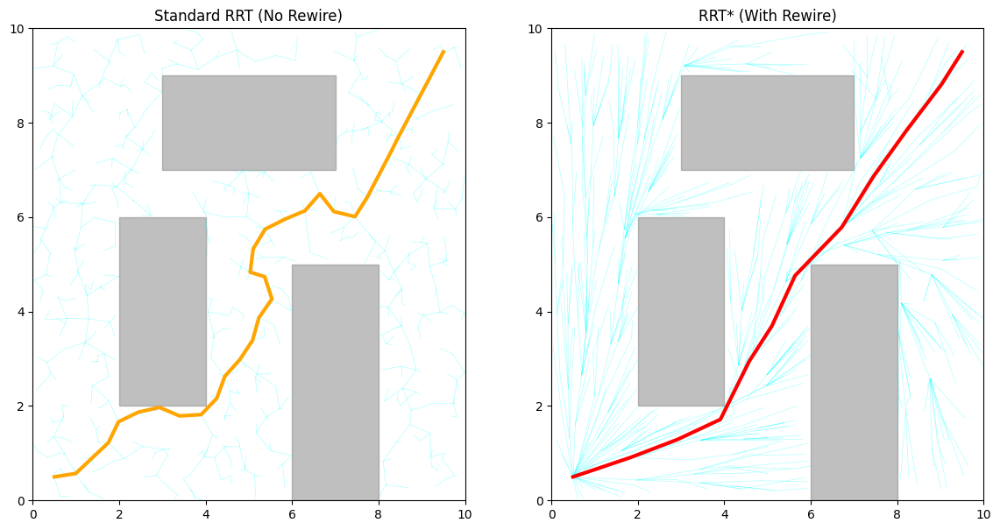


[ Performance Comparison / Iterations: 1000 ]
Metric               | Standard RRT       | RRT*              
---------------------|--------------------|--------------------
Path Cost (Dist)     |              15.39 |              13.26
Computation Time     |            3.7617s |            2.3550s

Result: RRT* optimized the path by 13.8% compared to Standard RRT.


In [ ]:
import time

def compare_rrt_performance(sx=0.5, sy=0.5, gx=9.5, gy=9.5, iterations=1000):
    start = np.array([sx, sy])
    goal = np.array([gx, gy])

    # 1. Standard RRT (radius=0 にすることで Rewire を無効化)
    start_time = time.time()
    nodes_rrt, path_rrt = rrt_star(start, goal, max_iter=iterations, radius=0)
    time_rrt = time.time() - start_time
    cost_rrt = sum(distance(path_rrt[i], path_rrt[i+1]) for i in range(len(path_rrt)-1)) if len(path_rrt) > 1 else float('inf')

    # 2. RRT* (radius=1.5 で Rewire を有効化)
    start_time = time.time()
    nodes_star, path_star = rrt_star(start, goal, max_iter=iterations, radius=1.5)
    time_star = time.time() - start_time
    cost_star = sum(distance(path_star[i], path_star[i+1]) for i in range(len(path_star)-1)) if len(path_star) > 1 else float('inf')

    # 可視化
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))

    for ax, nodes, path, title, color in zip([ax1, ax2], [nodes_rrt, nodes_star], [path_rrt, path_star],
                                            ["Standard RRT (No Rewire)", "RRT* (With Rewire)"], ['orange', 'red']):
        for (ox, oy, w, h) in obstacles:
            ax.add_patch(Rectangle((ox, oy), w, h, color='gray', alpha=0.5))
        for node in nodes:
            if node.parent is not None:
                ax.plot([node.point[0], node.parent.point[0]], [node.point[1], node.parent.point[1]],
                        color='cyan', linewidth=0.5, alpha=0.3)
        if len(path) > 1:
            path_np = np.array(path)
            ax.plot(path_np[:,0], path_np[:,1], color=color, linewidth=3)
        ax.set_title(title)
        ax.set_xlim(0, X_LIMIT); ax.set_ylim(0, Y_LIMIT)

    plt.show()


# Numerical Output (English Version)
    print(f"\n[ Performance Comparison / Iterations: {iterations} ]")
    print(f"{'Metric':<20} | {'Standard RRT':<18} | {'RRT* ':<18}")
    print(f"{'-'*21}|{'-'*20}|{'-'*20}")
    print(f"{'Path Cost (Dist)':<20} | {cost_rrt:18.2f} | {cost_star:18.2f}")
    print(f"{'Computation Time':<20} | {time_rrt:17.4f}s | {time_star:17.4f}s")

    if cost_rrt != float('inf') and cost_star != float('inf'):
        improvement = (cost_rrt - cost_star) / cost_rrt * 100
        print(f"\nResult: RRT* optimized the path by {improvement:.1f}% compared to Standard RRT.")
    elif cost_star == float('inf'):
        print("\nResult: RRT* failed to find a path within the given iterations.")

compare_rrt_performance(iterations=1000)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
import random

rc('animation', html='jshtml')

# ==========================================
# 1. 設定
# ==========================================
L1, L2 = 0.3, 0.3

OBSTACLES = [
    [0.4, 0.2, 0.7, 0.8],
    [-0.9, -0.6, 0.6, 0.5]
]

START_ANGLES = np.radians([0, 0])
GOAL_ANGLES  = np.radians([130, -90])

STEP_SIZE = 0.08
GOAL_BIAS = 0.15
SEARCH_RADIUS = 0.4


def get_arm_points(theta1, theta2):
    p0 = np.array([0, 0])
    p1 = np.array([L1*np.cos(theta1), L1*np.sin(theta1)])
    p2 = p1 + np.array([L2*np.cos(theta1+theta2), L2*np.sin(theta1+theta2)])
    return p0, p1, p2



def segment_intersects_rect(p1, p2, rect):
    ox, oy, w, h = rect
    xmin, xmax = ox, ox + w
    ymin, ymax = oy, oy + h

    dx = p2[0] - p1[0]
    dy = p2[1] - p1[1]

    p = [-dx, dx, -dy, dy]
    q = [p1[0] - xmin,
         xmax - p1[0],
         p1[1] - ymin,
         ymax - p1[1]]

    u1, u2 = 0.0, 1.0

    for pi, qi in zip(p, q):
        if pi == 0:
            if qi < 0:
                return False
        else:
            t = qi / pi
            if pi < 0:
                u1 = max(u1, t)
            else:
                u2 = min(u2, t)

    return u1 <= u2



def is_collision(theta1, theta2):
    p0, p1, p2 = get_arm_points(theta1, theta2)

    for rect in OBSTACLES:
        if segment_intersects_rect(p0, p1, rect):
            return True
        if segment_intersects_rect(p1, p2, rect):
            return True

    return False



def check_path_safety(a1, a2):
    dist = np.linalg.norm(a2 - a1)
    steps = int(dist / 0.04) + 10

    for i in range(steps + 1):
        angles = a1 + (a2 - a1) * (i / steps)
        if is_collision(angles[0], angles[1]):
            return True
    return False



# RRT* 本体

class Node:
    def __init__(self, angles):
        self.angles = np.array(angles)
        self.parent = None
        self.cost = 0.0


def solve_rrt_star():
    nodes = [Node(START_ANGLES)]

    for _ in range(3000):

        rand = GOAL_ANGLES if random.random() < GOAL_BIAS else \
               np.array([random.uniform(-np.pi, np.pi),
                         random.uniform(-np.pi, np.pi)])

        nearest = min(nodes,
                      key=lambda n: np.linalg.norm(n.angles - rand))

        direction = rand - nearest.angles
        dist = np.linalg.norm(direction)
        if dist == 0:
            continue

        new_angles = nearest.angles + \
                     direction/dist * min(STEP_SIZE, dist)

        if check_path_safety(nearest.angles, new_angles):
            continue

        new_node = Node(new_angles)

        neighbors = [n for n in nodes
                     if np.linalg.norm(n.angles - new_node.angles)
                     < SEARCH_RADIUS]

        best_parent = nearest
        min_cost = nearest.cost + \
                   np.linalg.norm(nearest.angles - new_node.angles)

        for n in neighbors:
            new_cost = n.cost + \
                       np.linalg.norm(n.angles - new_node.angles)
            if new_cost < min_cost:
                if not check_path_safety(n.angles, new_node.angles):
                    best_parent = n
                    min_cost = new_cost

        new_node.parent = best_parent
        new_node.cost = min_cost
        nodes.append(new_node)

        # Rewire
        for n in neighbors:
            new_cost = new_node.cost + \
                       np.linalg.norm(n.angles - new_node.angles)
            if new_cost < n.cost:
                if not check_path_safety(new_node.angles, n.angles):
                    n.parent = new_node
                    n.cost = new_cost

    # ゴールへ最も近いノード
    goal_node = min(nodes,
                    key=lambda n:
                    np.linalg.norm(n.angles - GOAL_ANGLES))

    path = [GOAL_ANGLES]
    current = goal_node
    while current:
        path.append(current.angles)
        current = current.parent

    return path[::-1]


# 補間

def interpolate_path(path):
    smooth = []
    for i in range(len(path)-1):
        if check_path_safety(path[i], path[i+1]):
            continue
        for t in np.linspace(0, 1, 20, endpoint=False):
            smooth.append(path[i]*(1-t) + path[i+1]*t)
    smooth.append(path[-1])
    return smooth


raw_path = solve_rrt_star()
path = interpolate_path(raw_path)



fig, ax = plt.subplots(figsize=(7,7))
ax.set_xlim(-1.5,1.5)
ax.set_ylim(-1.5,1.5)
ax.set_aspect('equal')

for rect in OBSTACLES:
    ax.add_patch(plt.Rectangle((rect[0],rect[1]),
                               rect[2],rect[3],
                               color='darkred',
                               alpha=0.6))

arm_line, = ax.plot([], [], lw=6)
joints, = ax.plot([], [], 'o')

def animate(i):
    p0,p1,p2 = get_arm_points(path[i][0], path[i][1])
    arm_line.set_data([p0[0],p1[0],p2[0]],
                      [p0[1],p1[1],p2[1]])
    joints.set_data([p0[0],p1[0],p2[0]],
                    [p0[1],p1[1],p2[1]])
    return arm_line, joints

ani = animation.FuncAnimation(
    fig, animate,
    frames=len(path),
    interval=30,
    blit=True)

plt.close()
ani


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
import random

rc('animation', html='jshtml')

# ==========================================
# 1. 設定
# ==========================================
L1, L2 = 0.3, 0.3

OBSTACLES = [
    [0.4, 0.2, 0.7, 0.8],
    [-0.9, -0.6, 0.6, 0.5]
]

START_ANGLES = np.radians([0, 0])
GOAL_ANGLES  = np.radians([130, -90])

STEP_SIZE = 0.08
GOAL_BIAS = 0.15
SEARCH_RADIUS = 0.4


def get_arm_points(theta1, theta2):
    p0 = np.array([0, 0])
    p1 = np.array([L1*np.cos(theta1), L1*np.sin(theta1)])
    p2 = p1 + np.array([L2*np.cos(theta1+theta2), L2*np.sin(theta1+theta2)])
    return p0, p1, p2



def segment_intersects_rect(p1, p2, rect):
    ox, oy, w, h = rect
    xmin, xmax = ox, ox + w
    ymin, ymax = oy, oy + h

    dx = p2[0] - p1[0]
    dy = p2[1] - p1[1]

    p = [-dx, dx, -dy, dy]
    q = [p1[0] - xmin,
         xmax - p1[0],
         p1[1] - ymin,
         ymax - p1[1]]

    u1, u2 = 0.0, 1.0

    for pi, qi in zip(p, q):
        if pi == 0:
            if qi < 0:
                return False
        else:
            t = qi / pi
            if pi < 0:
                u1 = max(u1, t)
            else:
                u2 = min(u2, t)

    return u1 <= u2



def is_collision(theta1, theta2):
    p0, p1, p2 = get_arm_points(theta1, theta2)

    for rect in OBSTACLES:
        if segment_intersects_rect(p0, p1, rect):
            return True
        if segment_intersects_rect(p1, p2, rect):
            return True

    return False



def check_path_safety(a1, a2):
    dist = np.linalg.norm(a2 - a1)
    steps = int(dist / 0.04) + 10

    for i in range(steps + 1):
        angles = a1 + (a2 - a1) * (i / steps)
        if is_collision(angles[0], angles[1]):
            return True
    return False



# RRT* 本体

class Node:
    def __init__(self, angles):
        self.angles = np.array(angles)
        self.parent = None
        self.cost = 0.0


def solve_rrt_star():
    nodes = [Node(START_ANGLES)]

    for _ in range(3000):

        rand = GOAL_ANGLES if random.random() < GOAL_BIAS else \
               np.array([random.uniform(-np.pi, np.pi),
                         random.uniform(-np.pi, np.pi)])

        nearest = min(nodes,
                      key=lambda n: np.linalg.norm(n.angles - rand))

        direction = rand - nearest.angles
        dist = np.linalg.norm(direction)
        if dist == 0:
            continue

        new_angles = nearest.angles + \
                     direction/dist * min(STEP_SIZE, dist)

        if check_path_safety(nearest.angles, new_angles):
            continue

        new_node = Node(new_angles)

        neighbors = [n for n in nodes
                     if np.linalg.norm(n.angles - new_node.angles)
                     < SEARCH_RADIUS]

        best_parent = nearest
        min_cost = nearest.cost + \
                   np.linalg.norm(nearest.angles - new_node.angles)

        for n in neighbors:
            new_cost = n.cost + \
                       np.linalg.norm(n.angles - new_node.angles)
            if new_cost < min_cost:
                if not check_path_safety(n.angles, new_node.angles):
                    best_parent = n
                    min_cost = new_cost

        new_node.parent = best_parent
        new_node.cost = min_cost
        nodes.append(new_node)

        # Rewire
        for n in neighbors:
            new_cost = new_node.cost + \
                       np.linalg.norm(n.angles - new_node.angles)
            if new_cost < n.cost:
                if not check_path_safety(new_node.angles, n.angles):
                    n.parent = new_node
                    n.cost = new_cost

    # ゴールへ最も近いノード
    goal_node = min(nodes,
                    key=lambda n:
                    np.linalg.norm(n.angles - GOAL_ANGLES))

    path = [GOAL_ANGLES]
    current = goal_node
    while current:
        path.append(current.angles)
        current = current.parent

    return path[::-1]


# 補間

def interpolate_path(path):
    smooth = []
    for i in range(len(path)-1):
        if check_path_safety(path[i], path[i+1]):
            continue
        for t in np.linspace(0, 1, 20, endpoint=False):
            smooth.append(path[i]*(1-t) + path[i+1]*t)
    smooth.append(path[-1])
    return smooth


raw_path = solve_rrt_star()
path = interpolate_path(raw_path)



fig, ax = plt.subplots(figsize=(7,7))
ax.set_xlim(-1.5,1.5)
ax.set_ylim(-1.5,1.5)
ax.set_aspect('equal')

for rect in OBSTACLES:
    ax.add_patch(plt.Rectangle((rect[0],rect[1]),
                               rect[2],rect[3],
                               color='darkred',
                               alpha=0.6))

# --- ここを追加：スタートとゴールの位置をプロット ---
# スタートとゴールのエンドエフェクタ（アームの先端）の位置を計算
_, _, start_ee = get_arm_points(START_ANGLES[0], START_ANGLES[1])
_, _, goal_ee = get_arm_points(GOAL_ANGLES[0], GOAL_ANGLES[1])

# スタート位置を★、ゴール位置を〇でプロット
# markersizeを少し大きくして見やすくしています。
# 凡例（label）も追加
ax.plot(start_ee[0], start_ee[1], 'b*', markersize=18, label='★ Start') # 青色の星
ax.plot(goal_ee[0], goal_ee[1], 'go', markersize=14, label='〇 Goal') # 緑色の円

# 凡例を表示
ax.legend(loc='upper right')
# ----------------------------------------------------

arm_line, = ax.plot([], [], lw=6)
joints, = ax.plot([], [], 'o')

def animate(i):
    p0,p1,p2 = get_arm_points(path[i][0], path[i][1])
    arm_line.set_data([p0[0],p1[0],p2[0]],
                      [p0[1],p1[1],p2[1]])
    joints.set_data([p0[0],p1[0],p2[0]],
                    [p0[1],p1[1],p2[1]])
    return arm_line, joints

ani = animation.FuncAnimation(
    fig, animate,
    frames=len(path),
    interval=30,
    blit=True)

plt.close()
ani

/tmp/ipython-input-390/2637903280.py:222: UserWarning: Glyph 12295 (\N{IDEOGRAPHIC NUMBER ZERO}) missing from font(s) DejaVu Sans.
  ani = animation.FuncAnimation(
/usr/local/lib/python3.12/dist-packages/IPython/core/formatters.py:345: UserWarning: Glyph 12295 (\N{IDEOGRAPHIC NUMBER ZERO}) missing from font(s) DejaVu Sans.
  return method()
